#                           ALGORITHME DE RECOMMENDATION DE FILMS 

## CONTEXTE

Au cours des dernières décennies, avec la montée du nombre d’utilisateurs sur les réseaux sociaux et de nombreux autres services Web (Amazon, Netflix …), les systèmes de recommandation ont pris de plus en plus de place dans nos vies. Du e-commerce à la publicité en ligne , les systèmes de recommandation sont aujourd'hui incontournables dans nos parcours quotidiens en ligne. D’une façon très générale, les systèmes de recommandation sont des algorithmes visant à proposer des éléments pertinents aux utilisateurs ( du texte à lire, des produits à acheter, des films à regarder, ou tout autre élément selon le secteur ). Notre projet est ainsi de construire un algorithme de recommandation à partir des préférences utilisateurs.
L’objectif de ce projet est d’implémenter un système de recommandation en se basant sur des algorithmes de machine learning. Le but sera donc de chercher les films à recommander aux utilisateurs en se basant sur différentes informations fournies par les utilisateurs concernant leurs préférences.

### Import des différents modules pythons

La premiere étape connsiste à importer les packages necessaires pour la manipulation des donnees et d'importer nos dataframes: 

In [1]:
import pandas as pd
import numpy as np
import os
import json
import ast
from ast import literal_eval
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import StandardScaler
import datetime
from sklearn.decomposition import PCA
from matplotlib.backends.backend_pdf import PdfPages
from IPython.display import Image

## A. Collecte et traitement des  données brutes :
#### lien : https://www.kaggle.com/rounakbanik/the-movies-dataset

Les données utilisées pour notre étude proviennent d’une plateforme web organisant des compétitions en science des données nommée Kaggle. L'ensemble de données Full MovieLens, composé de 26 millions de notes et de 750000 applications de balises de 270000 utilisateurs sur les 45000 films de cet ensemble de données, est accessible ici https://www.kaggle.com/rounakbanik/the-movies-dataset. On dispose en tout de 7 tables de données films dont on utilisera que 3 (movies_metadat.csv, keywords,csv et ratings.csv):

**1. movies_metadata.csv :** Le fichier principal de métadonnées de films. Contient des informations sur 45 000 films présentés dans l'ensemble de données Full MovieLens. Les fonctionnalités incluent des affiches, des toiles de fond, le budget, les revenus, les dates de sortie, les langues, les pays de production et les entreprises.

**2. keywords.csv :** Contient les mots-clés de l'intrigue de films pour nos films MovieLens. Disponible sous la forme d'un objet JSON.

**3. credits.csv :** Contient des informations sur les acteurs et l'équipe pour tous nos films. Disponible sous la forme d'un objet JSON.

**4. links.csv :** Le fichier qui contient les ID TMDB et IMDB de tous les films présentés dans l'ensemble de données Full MovieLens.

**5. links_small.csv :** Contient les ID TMDB et IMDB d'un petit sous-ensemble de 9 000 films de l'ensemble de données complet.

**6. ratings_small.csv :** Le sous-ensemble de 100 000 évaluations de 700 utilisateurs sur 9 000 films.

**7. ratings.csv :** regroupe 26 millions d'évaluations attribuées par 270 000 utilisateurs pour ces 45 000 films. Les notes sont sur une échelle de 1 à 5 et ont été obtenues sur le site officiel de GroupLens. 

## Mise en place du DataLake

Pour créer notre datalake, nous avions utlisé d'une part un outil d'ingestion et de stockage de la donnée et d'autre part pour faciliter ainsi le traitement et le partage au sein de notre équipe , nous avions mis en place une connexion à distance sur un pc qui nous servira de serveur distant. 
Cependant, dans la suite nous n'utiliseront que les données stockés en local pour éffectuer notre projet afin de faciliter les traitement à tout un chacun.

## Architecture du Datalake

**DOCKER --> HDFS**
**DOCKER** est un logiciel libre permettant de lancer des applications dans des conteneurs logiciels.
**HADOOP**(Hadoop Distributed File System) est un système de fichier distribué permettant de stocker et de récupérer des fichiers en un temps record.
Etant donné que nos dataframes sont des fichiers.csv et qu'on a pas Hadoop installé en local, nous nous servons de docker pour lancer une image linux sur laquelle est installée Hadoop et ensuite stocker en local nos datas sur un cluster.
Enfin pour créer une connexion distante avec les membres de l'équipe, nous nous sevons du logiciel **NGROCK** qui permet de créer un port distant lié au local. La gestion du flux de données entre le local et le cluster HDFS a donc été automatisée par des fichiers.bash.

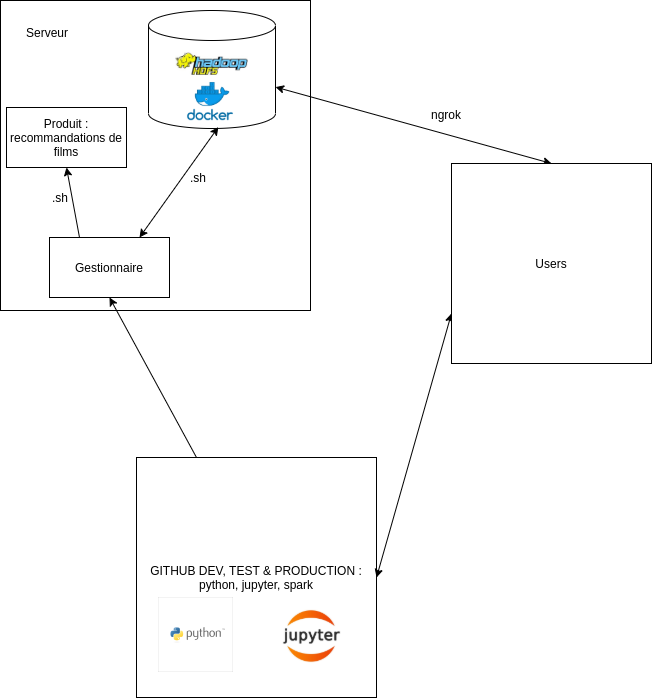

In [2]:
Image(filename="/home/fitec/PROJETS_FIL_ROUGE/LIENS_GItub/Branche_Master/filrouge/architecture_datalake.png",width=700,height=400)

####  REMARQUE :

Comme évoqué dans la partie précédente,notre objectif était de créer notre datalake à partir d'un outil d'ingestion tel que **TALEND** et d'une base de données **CASSANDRA** ou **HDFS**. Même s'il n'a pas été utilisé dans la suite nous avions réussir à créer une connexion entre ces différents outils pour créer notre datalake grâce au logiciel **NGROCK**. Cependant, dans une perspective de faciliter de traitement de nos données nous avions opté pour le stockage directe de la donnée sous **HDFS** 

**TALEND FOR BIG DATA   -->  MYSQL ( CASSANDRA, HDFS)**

**TALEND FOR BIG DATA  -->  MYSQL  -->  CASSANDRA**

Dans cette partie, on assistera à deux phases de traitements sur les données brutes : un premier traitement sur la donnée brute et un second traitement sur les données déjas nettoyées qui sera utilisé dans la seconde partie de Machine Learning.

## 1. Premier traitement sur la donnée brute 

In [3]:
################### fichier input ###############################
input_dir = "/home/fitec/PROJETS_FIL_ROUGE/LIENS_GItub/Branche_Master/filrouge/Data_films/"
################################################################

#IMPORT DATA et aperçu de la donnée

data = pd.read_csv(input_dir + "movies_metadata.csv")
keywords = pd.read_csv(input_dir + "keywords.csv")
ratings=pd.read_csv(input_dir + "ratings.csv", delimiter = ',')
data.head(3)

/home/fitec/.local/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning:

Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.



,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0


Pour avoir un aperçu des tables et de lister le noms des variables, leurs types ainsi que la taille de la base de donnees, on utilise la commande .info():

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_date           45379 non-null  object 
 15  re

In [5]:
## aperçu de la data keywords
keywords.head(3)

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."


In [6]:
## Aperçu de la data ratings
ratings.head(3)

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523


**Suppression des caractères spéciaux dans la metadata movies**

Pour supprimer les caractères spéciaux; on crée une fonction **delete_special_character** dont on initialisera les caractères que l'on veut avoir dans notre table. Elle parcourira chaque caractère des chaînes de caractères de notre table et en fera une comparaison avec nos caractères initiaux. si le caractère n'existe pas dans la liste des caractères initiaux, elle remplacera ce dernier par un vide et retournera la nouvelle chaîne de caractère ainsi obtenue.

In [7]:
def delete_special_character(x):
    accepted_character = ['.',',','0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'a', 'z', 'e', 'r', 't', 'y', 'u', 'i', 'o', 'p', 'q', 's', 'd', 'f', 'g', 'h', 'j', 'k', 'l', 'm', 'w', 'x', 'c', 'v', 'b', 'n', 'A', 'Z', 'E', 'R', 'T', 'Y', 'U', 'I', 'O', 'P', 'Q', 'S', 'D', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'W', 'X', 'C', 'V', 'B', 'N', '{', '}', '[', ']', ':', ',', '_', '-', "'", '"']
    if type(x) == str:
        clean_str = ""
        for i, lettre in enumerate(x):
            if lettre not in accepted_character:
                clean_str += ""
            else:
                clean_str += lettre
        return clean_str
    else:
        return x

test = data.applymap(lambda x: delete_special_character(x))

**Traitement des colones qui sont mixées en type c'est à dire ayant différents types**

Pour traiter les colonnes mixées de types, on définit pour chaque colonne le type adéquat en fonction de nos traitements suivants et l'on force la colonne à prendre ce type.

In [9]:
#adult : ok

#belongs_to_collection
test["belongs_to_collection"] = test["belongs_to_collection"].apply(lambda x : "[]" if type(x) == float else x)

#budget
test["budget"] = test["budget"].apply(lambda x : float(x) if x not in ["ff9qCepilowshEtG2GYWwzt2bs4.jpg", "zV8bHuSL6WXoD6FWogP9j4x80bL.jpg", "zaSf5OG7V8X8gqFvly88zDdRm46.jpg"] else 0)

#genres : ok

#homepage
test["homepage"] = test["homepage"].apply(lambda x : "" if type(x) == float else x)

#id
test["id"] = test["id"].apply(lambda x : x if x not in ["1997-08-20", "2012-09-29", "2014-01-01"] else "")
test = test[test["id"] != ""]
test["id"] = test["id"].apply(lambda x : int(x))

#imdb_id
test["imdb_id"] = test["imdb_id"].apply(lambda x : "" if pd.isnull(x) else x)

#original_language
test["original_language"] = test["original_language"].apply(lambda x : "" if pd.isnull(x) else x)

#original_title : ok

#overview
test["overview"] = test["overview"].apply(lambda x : "" if pd.isnull(x) else x)

#popularity
test["popularity"] = test["popularity"].apply(lambda x : x if x not in ["BewareOfFrostBites"] else 0)
test["popularity"] = test["popularity"].apply(lambda x : 0 if pd.isnull(x) else float(x))

#poster_path
test["poster_path"] = test["poster_path"].apply(lambda x : "" if pd.isnull(x) else str(x))

#production_companies
test["production_companies"] = test["production_companies"].apply(lambda x : "[]" if pd.isnull(x) else x)

#production_countries
test["production_countries"] = test["production_countries"].apply(lambda x : "[]" if pd.isnull(x) else x)

#release_date
test["release_date"] = test["release_date"].apply(lambda x : "" if pd.isnull(x) else str(x))

#revenue
test["revenue"] = test["revenue"].apply(lambda x : 0 if pd.isnull(x) else float(x))

#runtime
test["runtime"] = test["runtime"].apply(lambda x : 0 if pd.isnull(x) else x)

### spoken_languages ok
test["spoken_languages"] = test["spoken_languages"].apply(lambda x : "" if pd.isnull(x) else str(x))

### status ok
test["status"] = test["status"].apply(lambda x : "" if pd.isnull(x) else str(x))

### tagline ok
test["tagline"] = test["tagline"].apply(lambda x : "" if pd.isnull(x) else str(x))

### title ok
test["title"] = test["title"].apply(lambda x : "" if pd.isnull(x) else str(x))

### video ok
test["video"] = test["video"].apply(lambda x : "" if pd.isnull(x) else str(x))
test["vote_average"] = test["vote_average"].apply(lambda x : 0 if pd.isnull(x) else float(x))

#vote_count
test["vote_count"] = test["vote_count"].apply(lambda x : 0 if pd.isnull(x) else int(x))

### Ecriture de la nouvelle data netoyée dans un fichier csv sans caractères spéciaux
test.to_csv(input_dir + "metadata_carac_speciaux.csv", index= False)

### suppression des datas brutes de la mémoire

del data
del test

In [10]:
# Traitement du fichier keywords.csv

# suppression des caracteres spéciaux

keywords = keywords.applymap(lambda x: delete_special_character(x))    
keywords.to_csv(input_dir + "keywords_carac_speciaux.csv", index= False)

del keywords

In [11]:
# Traitement du fichier ratings.csv

# enlever les doublons

ratings = pd.read_csv(input_dir + "ratings.csv")
ratings.dropna(subset=['userId'])
ratings=ratings.dropna(subset=['movieId'])
ratings=ratings.drop_duplicates()
ratings.to_csv(input_dir + "clean_ratings.csv", index= False)

del ratings

Après nettoyage on dispose de nos données corrigées et sans caractères spéciaux. On commence donc l’étape préparation et traitement des variables. D'abord on supprime les valeurs manquantes (missing). Ensuite on sélectionne que le films dejà sortis au cinema avec la variable 'released'. Puis on transforme la varible adult en variable categorique pour faciliter le traitement. Enfin on supprime toute repetition et redondance dans notre data.

## Architecture de la mise en place de l'algorithme ML

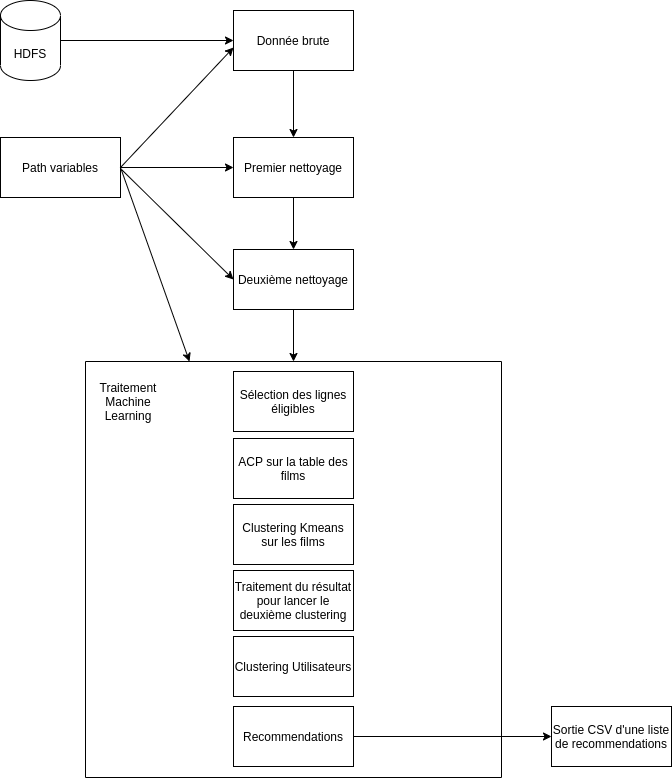

In [12]:
Image(filename="/home/fitec/PROJETS_FIL_ROUGE/LIENS_GItub/Branche_Master/filrouge/Architecture ml.png",width=700,height=400)

## 2. Traitement des colonnes pour la ML

In [13]:
# Import des données sans caractères spéciaux

metadata = pd.read_csv(input_dir + "metadata_carac_speciaux.csv")
keywords=pd.read_csv(input_dir + "keywords_carac_speciaux.csv", delimiter = ',')

Après une etude approffondie des donnees et de nos besoins on a decide de ne garder que les variables (id, genres, original_language,production_companies,production_countries,release_date,title,vote_average,vote_count, adult_False,adult_True) dans la dataset Movies_metadata.csv.

In [14]:
# NETTOYAGE des colonnes de la data

#1 supprimer les valeurs missing
metadata=metadata.dropna(subset=['id'])
metadata=metadata.dropna(subset=['title'])

#2 selectionner les film=released
metadata=metadata.loc[metadata['status']== 'Released']

#3 encode adult var
metadata=pd.get_dummies(metadata, columns=["adult"])

#4 drop duplicates  
metadata=metadata.drop_duplicates()
metadata=metadata.drop_duplicates(subset='id', keep="first")

#5 selection variables
metadata=metadata[['genres', 
                     'id',
                     'original_language', 
                     'production_companies', 
                     'production_countries', 
                     'release_date',
                     'title'  , 
                     'vote_average',
                     'vote_count',
                     'adult_False', 
                     'adult_True']]

In [15]:
metadata['genres'].head(3) #brute

0    [{'id':16,'name':'Animation'},{'id':35,'name':...
1    [{'id':12,'name':'Adventure'},{'id':14,'name':...
2    [{'id':10749,'name':'Romance'},{'id':35,'name'...
Name: genres, dtype: object

Comme on peut le constater les variables qualitatives telles que genres, original_language, production_companies, production_coutries et keywords sont sous forme de dictionnaires et nécessitent donc un traitement particulier.  On ecrit donc une fonction **encoding_dic** qui transformera les valeurs en variables catégorielles pour enrichir davantage nos données. 

In [16]:
#6                                           Travail sur les variables dictionnaire

#########################fonction encoding pour attribuer 1 a chaque element qui existe dans la liste des categories############################
def encoding_dic(data, variable, liste):

    serie_col = data[variable]
    #Création de la colonne total : liste des catégories appartenant à la liste pour chaque ligne
    def add(x, liste_col):
        total = []
        if type(x) == str and x[0] == "[":
            a = ast.literal_eval(x)
            if len(a) > 0:
                for j in range(len(a)):
                    comp = a[j]["name"]
                    if comp in liste_col:
                        total.append(comp)
                if len(total) == 0:
                    total.append("none")
            else:
                total.append("null")
        return total
    
    total = serie_col.apply(lambda x : add(x, liste_col = liste))
    df = serie_col.to_frame()
    df["total"] = total
    
    #Création des colonnes pour le OneHotEncoding
    for genre in liste:
        df[genre] = 0
    
    #Complétion des colonnes OneHotEncoding grâce à la colonne total
    def add2(x,genre_cherche):
        for genre in x["total"]:
            if genre == genre_cherche:
                return 1
        return 0
    
    for genre in liste:
        df[genre] = df.apply(lambda x : add2(x, genre_cherche = genre), axis=1)
    
    return df

On sélectionne les catégories les plus utilisées dans chaque variable, ensuite on supprime les variables issues des transformations puis on effectue la concatenation en ajoutant les nouvelles categories a notre dataframe

In [17]:
##########################################################
liste_genre = ['Drama', 'Comedy', 'Thriller', 'Romance', 'Action', 'Horror', 'Crime', 'Documentary']
liste_prod_comp = ['WarnerBros.', 'Metro-Goldwyn-MayerMGM', 'ParamountPictures', 'TwentiethCenturyFoxFilmCorporation', 'UniversalPictures', 'ColumbiaPicturesCorporation', 'Canal', 'ColumbiaPictures', 'RKORadioPictures']
liste_prod_count = ['UnitedStatesofAmerica', 'null', 'UnitedKingdom', 'France', 'Germany', 'Italy', 'Canada', 'Japan', 'Spain', 'Russia']

dfgenres = encoding_dic(data=metadata, variable="genres", liste=liste_genre)
dfgenres=dfgenres.drop(['genres', 'total'], axis=1)
dfprodcomp = encoding_dic(data=metadata, variable="production_companies", liste=liste_prod_comp)
dfprodcomp=dfprodcomp.drop(['production_companies', 'total'], axis=1)
dfprodcount = encoding_dic(data=metadata, variable="production_countries", liste=liste_prod_count)
dfprodcount=dfprodcount.drop(['production_countries', 'total'], axis=1)

datamovienew=pd.concat([metadata, dfgenres, dfprodcomp, dfprodcount], axis=1)

datamovienew=datamovienew.drop(['genres', 'production_companies', 'production_countries'], axis=1)

#                                   Fin du travail sur les variables dictionnaire

On éffectue les memes étapes du traitement précédent sur la dataframe keywords et on fait une jointure avec datamovienew pour récuperer les mots clés associés a chaque film:

In [18]:
#7 ajouter la variable keywords de la table keywords

keywords=keywords.dropna(subset=['id'])
keywords=keywords.drop_duplicates(subset='id', keep="first")

liste_key=['woman director', 'independent film', 'murder', 'based on novel', 'musical', 'sex', 'violence', 'nudity', 'biography', 'revenge', 'suspense', 'love', 'female nudity', 'sport', 'police', 'teenager', 'duringcreditsstinger', 'sequel', 'friendship', 'world war ii', 'drug', 'prison', 'stand-up comedy', 'high school', 'martial arts', 'suicide', 'kidnapping', 'rape', 'silent film', 'film noir', 'family', 'serial killer', 'monster', 'alien', 'dystopia', 'paris', 'new york', 'blood', 'gay', 'short', 'marriage', 'christmas', 'gore', 'zombie', 'death', 'gangster', 'small town', 'london england', 'romance', 'prostitute', 'detective', 'aftercreditsstinger', 'male nudity', 'robbery', 'vampire', 'father son relationship', 'wedding', 'los angeles', 'escape', 'dog', 'teacher', 'holiday', 'war', 'magic', 'hospital', 'doctor', 'music', 'remake', 'jealousy', 'based on true story', 'ghost', 'party', 'island', 'spy', 'new york city', 'lgbt', 'japan', 'daughter', 'investigation', 'coming of age', 'money', 'superhero', 'infidelity', 'corruption', 'torture', 'brother brother relationship', 'homosexuality', 'nazis', 'adultery', 'extramarital affair', 'wife husband relationship', 'slasher', 'supernatural', 'lawyer', 'dark comedy', 'friends', 'scientist']
dfkey= encoding_dic(data=keywords, variable="keywords", liste=liste_key)
dfkey=dfkey.drop(['keywords', 'total'], axis=1)

datakey=pd.concat([keywords, dfkey], axis=1)
datakey=datakey.drop(['keywords'], axis=1)

datamovienew=pd.merge(datamovienew,datakey, on='id')

On transforme ensuite la variable de type date 'release_date' en une variable qualitative avec les catégories suivantes:
date inconnue, films anciens, films récents et films très récents pour regrouper les films 
ayant une date de sorties dans un meme intervalle du temps.
Avec la commande get_dummies on aura directement les variables categorielles correspondantes:

In [20]:
#8 Catégorisation de la variable release_date

var = []
a0 = "date inconnue"
a1 = "films anciens"
a2 = "films récents"
a3 = "films très récents"

dates = datamovienew["release_date"]
a = dates.apply(lambda x : str(x))
a = pd.DataFrame(a.apply(lambda x : x[0:4]))

for i in range(0,len(a)):
    if (len(a.loc[i,'release_date']) < 4 ) :
        var.append(a0)
    elif (len(a.loc[i,'release_date']) >= 4 and int(a.loc[i,'release_date']) <= 1990) :
        var.append(a1)
    elif (len(a.loc[i,'release_date']) >= 4 and 1990 < int(a.loc[i,'release_date']) <= 2010) :
        var.append(a2)
    elif (len(a.loc[i,'release_date']) >= 4 and int(a.loc[i,'release_date']) > 2010):
        var.append(a3)

datamovienew["dates_types"] = var
datamovienew=pd.get_dummies(datamovienew, columns=["dates_types"])
datamovienew=datamovienew.drop(['release_date'], axis=1)


#9 Catégorisation de la variable original language

#Finalement pour la variable originale_language on garde que la langue anglaise, italienne, japonaise et allemande 
#Egalement ondefinit les categories avec get_dummies:

datamovienew["original_language"].unique()

def only_these_languages(x):
    if x not in ["fr", "en", "it", "ja", "de"]:
        return "other"
    else:
        return x
    
datamovienew["original_language"] = datamovienew["original_language"].apply(lambda x : only_these_languages(x))  
datamovienew=pd.get_dummies(datamovienew, columns=["original_language"])
final_data_movie = datamovienew



# Fin du nettoyage

             
#10 On save la table 
## la dataframe finale qui sera objet de notre analyse machine learning:

final_data_movie.to_csv(input_dir + "final_data_movie.csv", index= False)
final_data_movie.head()

,id,title,vote_average,vote_count,adult_False,adult_True,Drama,Comedy,Thriller,Romance,...,dates_types_date inconnue,dates_types_films anciens,dates_types_films récents,dates_types_films très récents,original_language_de,original_language_en,original_language_fr,original_language_it,original_language_ja,original_language_other
0,862,ToyStory,7.7,5415,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
1,8844,Jumanji,6.9,2413,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2,15602,GrumpierOldMen,6.5,92,1,0,0,1,0,1,...,0,0,1,0,0,1,0,0,0,0
3,31357,WaitingtoExhale,6.1,34,1,0,1,1,0,1,...,0,0,1,0,0,1,0,0,0,0
4,11862,FatheroftheBridePartII,5.7,173,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0


## B. MACHINE LEARNING SUR LES DONNÉES NETTOYÉES

## 1. Classification des films 

In [21]:
################### Initialisation des parametres simulation du KMEANS ##############################

remove_col_kmeans_movies = ['id','title','vote_average', 'vote_count']
trunc_user_high = 11500  #nombre max de vues total par user
trunc_user_low = 20  #nombre min de vues total par user
trunc_movie_low = 7
trunc_movie_high = 76000
coude_centroid_movies = 14
kmeans_centroid_movies = 4
coude_centroid_users  =9
kmeans_centroid_users = 4
n=5  ### nlombre de films à recommander

In [23]:
################### Parametres de Modelisation ##############################
p_c_a = True # Activer ou pas la Principal Component analysis
acp_dim = 26 # Principal Component analysis

###### Modelisation Kmeans utlisateur #########
a=0.8
# valeur de a doit être comprise entre zero et un!!!
# Pour a = 0,
# Si l'utilisateur a offert un rating de 5 a un des films. score vaut 5
# Si l'utilisateur n'a offert un rating de 5 a aucun un des films. score vaut le score moyen qu'il a offert aux films
# Pour a =1,
# Le score vaut toujours le score moyen qu'il a offert aux films

#plus a augmente et se rapproche de 1, plus l'ecart entre avoir son film préfére dans un cluster ou pas diminue

Les différents paramètres seront sauvegardés dans un fichier txt:

In [24]:
##########################################################################
date_time = datetime.datetime.now()
################### fichier output ##############################
output_dir = "/home/fitec/PROJETS_FIL_ROUGE/LIENS_GItub/Branche_Master/filrouge/output_"+str(date_time) +'/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
content_file =  'Colonnes retirées de tableau_movies'  + str(remove_col_kmeans_movies) +'\n'
content_file += 'On retire les utilisateurs ayant vu plus de ' + str(trunc_user_high) +' films' +'\n'
content_file += 'On retire les utilisateurs ayant vu moins de ' + str(trunc_user_low) +' films' +'\n'
content_file += 'On retire les films vus plus de ' + str(trunc_movie_high) +' fois' +'\n'
content_file += 'On retire les films vus moins de ' + str(trunc_movie_low) +' fois' +'\n'
content_file += 'Kmeans utilisateur avec parametre de combinaison linéaire ' + str(a) +' ' +'\n'
content_file += ' Nombre de centroides Kmeans Movies ' + str(kmeans_centroid_movies) +' ' +'\n'
content_file += ' Nombre de centroides Kmeans utilisateur ' + str(kmeans_centroid_users) +' ' +'\n'
if p_c_a:
    content_file += 'Principal Component Analysis activée et réduit à  ' + str(acp_dim ) + ' dimensions' + '\n'
else:
    content_file += 'Principal Component Analysis inactive  '

f = open(output_dir+"output"+str(date_time)+".txt", "a")
f.write(content_file)
f.close()

Etant donné le nombre important de variable, on effectute une ACP sur notre data pour réduire la dimension. Cette métode consistera à regrouper les variables qui seront fortement corrélées entre elles d'ou les nouvelles variables créees seront des combinaisons linéaires des variables initiales.

Text(0.5, 0, 'Nombre de variables')

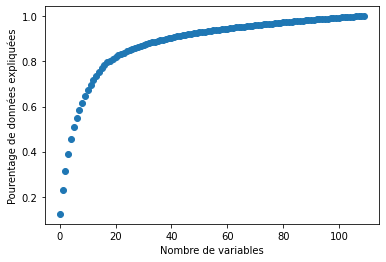

In [25]:
#Centrer et réduire vote average et vote count dans de nouvelles variables et les supprimer ensuite.

#### suppression des colonnes id et title

data = final_data_movie.drop(["id", "title"], axis = 1)

#transformation – centrage-réduction

sc = StandardScaler()
data[["vote_average", "vote_count"]] = pd.DataFrame(sc.fit_transform(data[["vote_average", "vote_count"]] ))

# réfléchir à enlever vote count et vote average:
# - elle ne condorde pas avec un count sur ratings
# - cette information se retrouvera dans le cluster d'utilisateurs
# - cela ne devrait peut etre pas permettre de rapprocher les films entre eux : 
# il y aura surement une cluster blockbusters et un cluster mauvais films  

data = data.drop(["vote_count", "vote_average"], axis = 1)

len(data.columns)
n_components = 0



#0 ACP sur final_data_movie
pca = PCA(n_components = 110)
pca_trans = pd.DataFrame(pca.fit_transform(data))

def somme_ajoutees(liste):
    retour = []
    calcul = 0
    for i in liste:
        calcul += i
        retour.append(calcul)
    return retour

explained_variances = somme_ajoutees(pca.explained_variance_ratio_)

plt.scatter(x = [i-1 for i in range(1,len(explained_variances) + 1)],y = explained_variances)
plt.ylabel("Pourentage de données expliquées")
plt.xlabel("Nombre de variables")
#Il semblerait par la méthode du coude que les 20 premieres composantes sont à sélectionner pour résumer la donnée


In [26]:
################### fichier pdf ##############################
pp = PdfPages(output_dir+'Récapitulatif graphiques '+str(date_time)+'.pdf')
firstPage = plt.figure(figsize=(11.69,8.27))
firstPage.clf()
txt = content_file
firstPage.text(0.5,0.5,txt, transform=firstPage.transFigure, size=12, ha="center")
pp.savefig()

<Figure size 841.68x595.44 with 0 Axes>

On a deja importé la table ratings on supprime donc la variable 'timestamp' et on garde que les id des films qui sont aussi dans la table final_data_movie:

In [27]:
################ Lecture et tri de la donnée ########################
tableau_movies_full = pd.read_csv(input_dir + "final_data_movie.csv")
ratings = pd.read_csv(input_dir + "clean_ratings.csv")
ratings  = ratings.drop(['timestamp'], axis = 1)

In [28]:
tableau_movies_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44954 entries, 0 to 44953
Columns: 140 entries, id to original_language_other
dtypes: float64(1), int64(138), object(1)
memory usage: 48.0+ MB


In [29]:
tableau_movies_full.head(3)

,id,title,vote_average,vote_count,adult_False,adult_True,Drama,Comedy,Thriller,Romance,...,dates_types_date inconnue,dates_types_films anciens,dates_types_films récents,dates_types_films très récents,original_language_de,original_language_en,original_language_fr,original_language_it,original_language_ja,original_language_other
0,862,ToyStory,7.7,5415,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
1,8844,Jumanji,6.9,2413,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2,15602,GrumpierOldMen,6.5,92,1,0,0,1,0,1,...,0,0,1,0,0,1,0,0,0,0


In [30]:
tableau_movies_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44954 entries, 0 to 44953
Columns: 140 entries, id to original_language_other
dtypes: float64(1), int64(138), object(1)
memory usage: 48.0+ MB


In [31]:
all_movies = list(tableau_movies_full.drop_duplicates("id")["id"])
ratings = ratings[ratings["movieId"].isin(all_movies)]
nbr_votes_movie = ratings.groupby("movieId")["movieId"].count().reset_index(name= "count_movie")
ratings = pd.merge(ratings, nbr_votes_movie, left_on="movieId", right_on='movieId', how='inner')
ratings = ratings[ratings["count_movie"]>trunc_movie_low]
ratings = ratings[ratings["count_movie"]<trunc_movie_high]
ratings = ratings.drop("count_movie", axis= 1)

#legit_movies = list(ratings.drop_duplicates("movieId")["movieId"])
#tableau_movies = tableau_movies_full[tableau_movies_full["id"].isin(legit_movies)]

del nbr_votes_movie
#del legit_movies
del all_movies

tableau_movies = tableau_movies_full.drop(tableau_movies_full[remove_col_kmeans_movies], axis = 1)

#on filtre les utilisateurs qui ont emis trop de votes, ou pas assez dans ratings
data_user_votes = ratings.groupby(["userId"])["rating"].apply(lambda x : len(list(x) )).reset_index(name = 'voteCount')
data_user_votes = data_user_votes[ trunc_user_low  < data_user_votes['voteCount'] ]
data_user_votes = data_user_votes[  data_user_votes['voteCount'] < trunc_user_high]
df = data_user_votes.sort_values(by=['voteCount'])

ratings = ratings[np.isin(ratings['userId'], data_user_votes['userId'])]

In [32]:
TAB = tableau_movies_full.loc[:,["id","title"]]
TAB.head()

,id,title
0,862,ToyStory
1,8844,Jumanji
2,15602,GrumpierOldMen
3,31357,WaitingtoExhale
4,11862,FatheroftheBridePartII


In [33]:
ratings["title"] = pd.merge(ratings, TAB, left_on = "movieId", right_on="id")["title"]
del TAB
ratings.head()

,userId,movieId,rating,title
1,11,110,3.5,ThreeColors:Red
3,24,110,5.0,ThreeColors:Red
4,29,110,3.0,ThreeColors:Red
5,30,110,5.0,ThreeColors:Red
6,33,110,3.0,ThreeColors:Red


In [34]:
######################## FIGURE 1 ##############################
fig1 = px.scatter(x=pd.Series(range(0,len(df['userId']))), y=df['voteCount'], title = "Nombre total de films notés par utilisateur selectionné")
fig1.show()
fig1.write_html(output_dir + "Nombre de vues total par utilisateur.html")

In [35]:
######################## Differents graphs pour illustrer ##############################
#On observe le plus haut rating qu'un utlisateur a offert aux films qu'il a noté
maxrating = ratings.groupby(["userId"])["rating"].apply(lambda x : max(x)).reset_index()

fig3 = px.histogram(maxrating, x="rating", title = "Repartition du plus haut score offert par un utilisateur")
fig3.update_xaxes(type='category')
fig3.show()

#On observe combien de film ont noté les utilisateurs ayant offert un score maximal assez bas
#df = data_user_votes[np.isin(data_user_votes['userId'], maxrating[maxrating['rating']<4]['userId'])]
#df = df.sort_values(by = ['voteCount'])
#fig4 = px.scatter(x=pd.Series(range(0,len(df['userId']))), y=df['voteCount'])

del data_user_votes
del df
#####################################################################################

In [36]:
####################### Principle Component Analysis #####################################

if p_c_a:
    pca = PCA(n_components=acp_dim, random_state=80)
    pca.fit(tableau_movies)
    tableau_movies = pd.DataFrame(pca.transform(tableau_movies))
tableau_movies.head(3)

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,-0.493527,-0.851422,0.043313,-0.708819,0.415719,0.200804,-0.103243,0.080502,-0.050038,-0.275692,...,-0.150737,-0.012259,-0.016654,0.069731,-0.035383,-0.044766,-0.022956,-0.054145,0.070944,0.091503
1,-0.448717,-0.809447,-0.013561,-0.174112,-0.201862,0.001049,-0.491489,0.197366,-0.076993,-0.005614,...,-0.377990,0.009107,-0.019855,-0.013376,-0.037850,-0.063523,-0.012459,-0.025927,-0.000871,-0.010520
2,-0.546933,-0.841869,-0.137933,-0.757249,0.737610,0.124025,-0.073831,-0.065110,0.232128,0.563658,...,-0.124235,-0.028543,0.001851,-0.033398,0.921495,-0.048700,0.103083,0.090771,0.004242,-0.011931


/home/fitec/.local/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



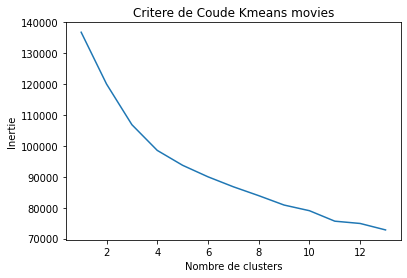

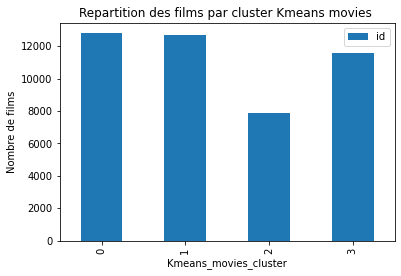

In [37]:
######################## COUDE KMEANS MOVIES ##############################
Inertie =[]
n_centroids = coude_centroid_movies
for i in range(1, n_centroids):
    kmeans = KMeans(n_clusters = i).fit(tableau_movies)
    Inertie.append(kmeans.inertia_)

coude_movies = plt.figure()
plt.plot(range(1, n_centroids), Inertie)
plt.title('Critere de Coude Kmeans movies')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
coude_movies.show()
pp.savefig(coude_movies)

#### on lance kmeans avec k clusters défini en parametre de simulation
kmeans = KMeans(n_clusters=kmeans_centroid_movies).fit(tableau_movies)
centroids = kmeans.cluster_centers_

movies = pd.DataFrame({'id': tableau_movies_full['id'], 'Kmeans_movies_cluster': kmeans.labels_})

# On ajoute le clustering à la table ratings
ratings = pd.merge(ratings, movies, left_on = "movieId", right_on = "id")

### on rajoute le cluster dans le tableau_movies_full
tableau_movies_full = pd.merge(tableau_movies_full, movies, left_on = "id", right_on = "id")

###### Graph de la répartition par cluster de film ######
####### Plotly
fig2 = px.histogram(movies, x="Kmeans_movies_cluster", title = "Repartition des films par cluster Kmeans movies ")
fig2.update_xaxes(type='category')
fig2.show()

fig2.write_html(output_dir + "Repartition des films par cluster Kmeans movies.html")
####### matplotlib pour le pdf
movies.groupby('Kmeans_movies_cluster').count().plot(kind='bar', title = "Repartition des films par cluster Kmeans movies ")
plt.ylabel('Nombre de films')
pp.savefig()
#########################################################################################

In [38]:
################ Traitement pour le kmeans users ##############################################

#permet d'avoir une info sur le cluster de film en complément du tableau ratings
user_movies = ratings.groupby(['userId', 'Kmeans_movies_cluster'])
df_score = user_movies['rating'].apply(lambda x : (1-a)*float(5) + a*sum(list(x))/len(list(x)) if float(5) in list(x) else a*sum(list(x))/len(list(x))).reset_index(name = 'score')
df_users = df_score.pivot(index = 'userId', columns = 'Kmeans_movies_cluster').reset_index()
df_users = df_users.replace(np.nan, 0)

df_kmeans_users = df_users['score']

del df_score

#################################################################################################

/home/fitec/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



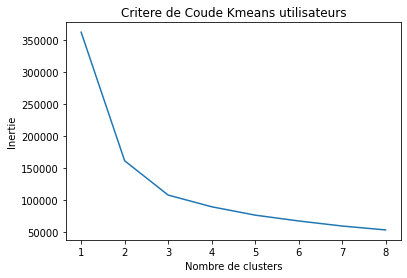

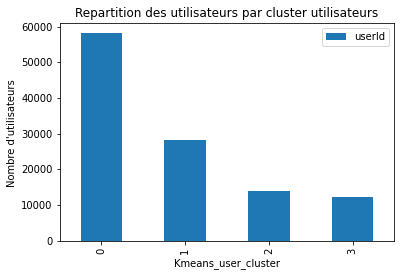

In [39]:
############################## Kmeans utilisateurs #######################################


######################## Coude users ##############################
Inertie =[]
n_centroids = coude_centroid_users
for i in range(1, n_centroids):
    kmeans = KMeans(n_clusters = i).fit(df_kmeans_users)
    #kmeans.fit(x)
    Inertie.append(kmeans.inertia_)


coude_users = plt.figure()
plt.plot(range(1, n_centroids), Inertie)
plt.title('Critere de Coude Kmeans utilisateurs')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
coude_users.show()
pp.savefig(coude_users)


#### choix du nombre de clusters pour le Kmeans utilisateurs
kmeans = KMeans(n_clusters=kmeans_centroid_users).fit(df_kmeans_users)
centroids = kmeans.cluster_centers_

user_clusters = pd.DataFrame({'userId': df_users[('userId', '')], 'Kmeans_user_cluster': kmeans.labels_})
# On ajoute le clustering à la tale ratings
ratings = pd.merge(ratings, user_clusters, left_on="userId", right_on="userId")

# nombre d'utilisateurs par cluster
nb_users_cluster = ratings.drop_duplicates("userId").groupby('Kmeans_user_cluster')["rating"].count().reset_index()
 
###### Graph de la répartition par cluster des users ######
fig5 =px.histogram(user_clusters, x="Kmeans_user_cluster", title = "Repartition des utilisateurs par cluster utilisateurs")
fig5.update_xaxes(type='category')
fig5.show()

fig5.write_html(output_dir + "Repartition des utilisateurs par cluster utilisateurs.html")

user_clusters.groupby('Kmeans_user_cluster').count().plot(kind='bar', title = "Repartition des utilisateurs par cluster utilisateurs")
plt.ylabel("Nombre d'utilisateurs ")
pp.savefig()

###########################################################################################

In [40]:
del user_clusters
del df_kmeans_users
del df_users
del movies

### Statistiques descriptives sur le duo clusters de films / clusters des utilisateurs

Pour chaque film noté dans chaque cluster des utilisateurs, on détermine le nombre de fois que le film a été noté et la moyenne des notes obtenues

In [41]:
### moyenne et compte de chaque duo film/cluster user
links = ratings.groupby(["Kmeans_user_cluster","movieId"])["rating"].count().reset_index(name="count")
moyenne = ratings.groupby(["Kmeans_user_cluster","movieId"])["rating"].mean().reset_index(name="mean")
links["mean"] = moyenne["mean"]
print("Dataframe avec le nombre de notes et la moyenne pour chaque film dans chaque cluster user :"+'\n'+str(links.head(5)))

Dataframe avec le nombre de notes et la moyenne pour chaque film dans chaque cluster user :
   Kmeans_user_cluster  movieId  count      mean
0                    0        2  11421  3.487304
1                    0        3   6217  3.384912
2                    0        5   6100  3.317131
3                    0        6  11801  3.951699
4                    0       11  11299  3.867732


In [42]:
### récupérer les meilleurs films par cluster user selon la mean
parmi_combien = 100
best_movies_per_cluster = links.sort_values(["Kmeans_user_cluster",'mean'],ascending=False).groupby("Kmeans_user_cluster").head(parmi_combien).reset_index(drop=True)
best_movies_per_cluster["nb_user_cluster"] = pd.merge(best_movies_per_cluster, nb_users_cluster, left_on="Kmeans_user_cluster", right_on = "Kmeans_user_cluster")["rating"]
best_movies_per_cluster["part"] = (best_movies_per_cluster["count"] / best_movies_per_cluster["nb_user_cluster"]) * 100
best_movies_per_cluster = pd.merge(best_movies_per_cluster, tableau_movies_full, left_on = "movieId", right_on = "id")[["title", "Kmeans_user_cluster","Kmeans_movies_cluster", "mean", "part"]].sort_values(["Kmeans_user_cluster", "mean"], ascending = False).reset_index()

In [43]:
# Lien cluster movies, cluster user
contingence_clusteruser_clustermovie = best_movies_per_cluster.groupby(["Kmeans_user_cluster", "Kmeans_movies_cluster"])["mean"].count().reset_index(name="count_per_cluster")
contingence_clusteruser_clustermovie = contingence_clusteruser_clustermovie.pivot(index = "Kmeans_user_cluster", columns = "Kmeans_movies_cluster", values = "count_per_cluster")

# visualisation des meilleurs films par cluster
visualisation_meilleurs_film_par_cluster = best_movies_per_cluster.pivot( columns = 'Kmeans_user_cluster', values ="title" )

for i in range(kmeans_centroid_users):
    index = (kmeans_centroid_users - 1 - i) *parmi_combien
    values = visualisation_meilleurs_film_par_cluster.loc[index:index+parmi_combien-1,i].reset_index(drop=True)
    visualisation_meilleurs_film_par_cluster[i] = values
    
visualisation_meilleurs_film_par_cluster = visualisation_meilleurs_film_par_cluster[0:parmi_combien-1]
####################################################################################################

### Recommandation du nombre n de films à chaque utilisateur

Dans cette partie, nous tenterons de recommander un nombre n de films à chaque utilisateur en se basant sur le résultat du clustering des utiliateurs.
D'abord, nous ordonnerons les films dans chaque clusters d'utilisateurs par moyenne des notes obtenues. Pour chaque utilisateur, on recommande les films de son cluster dans l'ordre décroissant de moyenne (sauf si il l'a déjà vu) jusqu'à compléter une liste de n films.

In [44]:
############################" Recommendations pour chaque utilisateur ###############################
# On veut maintenant recommander n films  à chaque utilisateur
# On commence par le meilleur film selon son groupe et on descend jusqu'à qu'il y ait n films à lui recommander

def delete_if_in_other(row):
    return [x for x in row["recommended"] if x not in row["title"]][0:n]

def recommendations():
    for i in range(kmeans_centroid_users):
        films = list(best_movies_per_cluster[best_movies_per_cluster["Kmeans_user_cluster"]==i]["title"])
        users = ratings[ratings["Kmeans_user_cluster"]==i]
        user_movie_list = users.groupby("userId")["title"].apply(list).reset_index()
        user_movie_list["recommended"] = [films for _ in range(len(user_movie_list))]
        user_movie_list["recommended"] = user_movie_list.apply(delete_if_in_other, axis=1)
        #user_movie_list = user_movie_list.drop("title", axis=1)
        
        if i == 0:
            toutes_les_recommendations = user_movie_list
        else:
            toutes_les_recommendations = pd.concat([toutes_les_recommendations, user_movie_list])
    
    del user_movie_list
    del films
    del users
    return toutes_les_recommendations

recommendations = recommendations()


# Sauvegarde des recommendations de fils aux utilisateurs dans un fichiers.csv
recommendations.to_csv(output_dir + "recommendations.csv", index= False)

In [45]:
recommendations.head()

,userId,title,recommended
0,4,"[YoungandInnocent, ConfessionofaChildoftheCent...","[Hydrozagadka, TheLastHouseonDeadEndStreet, Se..."
1,9,"[FoolsRushIn, YoungandInnocent, ConfessionofaC...","[Hydrozagadka, TheLastHouseonDeadEndStreet, Se..."
2,12,"[SleeplessinSeattle, FoolsRushIn, YoungandInno...","[Hydrozagadka, TheLastHouseonDeadEndStreet, Se..."
3,20,"[SleeplessinSeattle, LicensetoWed, Jarhead, Re...","[Hydrozagadka, TheLastHouseonDeadEndStreet, Se..."
4,24,"[ThreeColors:Red, SleeplessinSeattle, Sleeples...","[Hydrozagadka, TheLastHouseonDeadEndStreet, Se..."
